<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Generative adversarial networks</b></h3>



В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from pathlib import Path
from PIL import Image
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import LeaveOneOut
from sklearn.manifold import TSNE

sns.set(style='darkgrid', font_scale=1.2)

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d tommykamaz/faces-dataset-small

!mkdir images
!unzip -q -o faces-dataset-small.zip -d images | awk 'BEGIN {ORS=" "} {if(NR%50==0)print "."}'

DATA_DIR = Path('./images/faces_dataset_small/')

100% 3.97G/3.99G [00:17<00:00, 169MB/s]
100% 3.99G/3.99G [00:18<00:00, 235MB/s]


In [ ]:
DATA_DIR = './images/faces_dataset_small/'

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть.

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [ ]:
image_files = sorted(list(Path(DATA_DIR).rglob('*.png')))
print(len(image_files))

3143


In [ ]:
def get_dataloader(image_size, batch_size, stats):
  """
  Builds dataloader for training data.
  Use tt.Compose and tt.Resize for transformations
  :param image_size: height and wdith of the image
  :param batch_size: batch_size of the dataloader
  :returns: DataLoader object
  """
  transforms = tt.Compose([
            tt.Resize(image_size),
            tt.CenterCrop(image_size),
            tt.ToTensor(),
            tt.Normalize(*stats)
        ])

  data = ImageFolder('./images', transform=transforms)

  return DataLoader(data, batch_size = batch_size, shuffle=True, num_workers=2, pin_memory=True)

In [ ]:
image_size = 128
batch_size = 16
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

data_loader = get_dataloader(image_size, batch_size, stats)

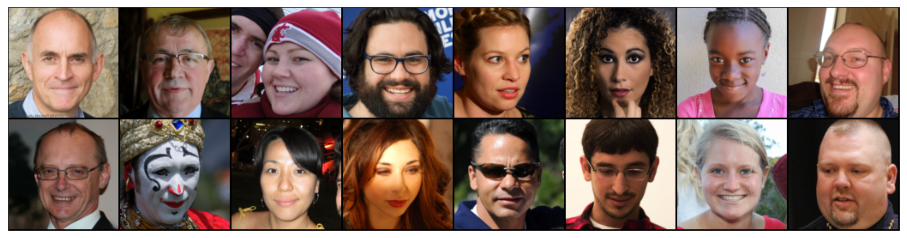

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

def show_images(images, nmax = 64):
    fig, ax = plt.subplots(figsize=(16, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

for images, _ in data_loader:
    show_images(images)
    break

## Часть 2. Построение и обучение модели (2 балла)

Сконструируйте генератор и дискриминатор. Помните, что:
* дискриминатор принимает на вход изображение (тензор размера `3 x image_size x image_size`) и выдает вероятность того, что изображение настоящее (тензор размера 1)

* генератор принимает на вход тензор шумов размера `latent_size x 1 x 1` и генерирует изображение размера `3 x image_size x image_size`

In [ ]:
discriminator = nn.Sequential(

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(inplace=True),

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(inplace=True),

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(inplace=True),

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(inplace=True),

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
latent_size = 128

generator = nn.Sequential(

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=2, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),

    nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(32),
    nn.ReLU(True),

    nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

torch.Size([16, 3, 128, 128])


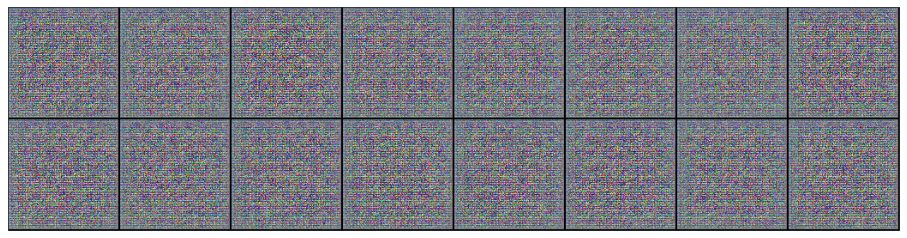

In [ ]:
x = torch.randn(batch_size, latent_size, 1, 1)
noise = generator(x)

print(noise.shape)
show_images(noise)

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь берем бинарную кросс-энтропию

**NB: я пропустила последнюю строчку и использовала MSE, так как в семинаре говорилось, что он может работать лучше. Sorry**

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
fixed_latent = torch.randn(128, latent_size, 1, 1, device=device)

def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
def fit(model, criterion, epochs, lr, start_idx = 1):
    model["discriminator"].train()
    model["generator"].train()
    torch.cuda.empty_cache()

    # keep track of losses
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(),
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }

    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(data_loader):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images.to(device))
            real_targets = torch.ones(real_images.size(0), 1, device=device)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()

            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()

            # Generate fake images
            latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
            fake_images = model["generator"](latent)

            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)
            targets = torch.ones(batch_size, 1, device=device)
            loss_g = criterion["generator"](preds, targets)

            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())

        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs,
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))

        # Save generated images
        if epoch == epochs - 1:
          save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
discriminator = discriminator.to(device)
generator = generator.to(device)

In [ ]:
lr = 0.00015
epochs = 40

model = {
    "discriminator": discriminator,
    "generator": generator
}

criterion = {
    "discriminator": nn.MSELoss(),
    "generator": nn.MSELoss()
}

In [ ]:
history = fit(model, criterion, epochs, lr)

  0%|          | 0/197 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([16, 1])) that is different to the input size (torch.Size([16, 25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


Epoch [1/40], loss_g: 0.9406, loss_d: 0.0333, real_score: 0.9300, fake_score: 0.0689


/usr/local/lib/python3.8/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([7, 1])) that is different to the input size (torch.Size([7, 25])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [2/40], loss_g: 0.9881, loss_d: 0.0088, real_score: 0.9777, fake_score: 0.0191


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [3/40], loss_g: 0.9884, loss_d: 0.0006, real_score: 0.9893, fake_score: 0.0097


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [4/40], loss_g: 0.9971, loss_d: 0.0001, real_score: 0.9954, fake_score: 0.0020


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [5/40], loss_g: 0.9999, loss_d: 0.3406, real_score: 0.6586, fake_score: 0.0015


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [6/40], loss_g: 0.9569, loss_d: 0.2131, real_score: 0.8077, fake_score: 0.0753


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [7/40], loss_g: 0.9597, loss_d: 0.0752, real_score: 0.9399, fake_score: 0.0697


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [8/40], loss_g: 0.9581, loss_d: 0.0762, real_score: 0.9325, fake_score: 0.0793


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [9/40], loss_g: 0.9334, loss_d: 0.1179, real_score: 0.8870, fake_score: 0.1173


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [10/40], loss_g: 0.9636, loss_d: 0.0528, real_score: 0.9309, fake_score: 0.0681


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [11/40], loss_g: 0.9579, loss_d: 0.0522, real_score: 0.9437, fake_score: 0.0685


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [12/40], loss_g: 0.9459, loss_d: 0.0775, real_score: 0.9113, fake_score: 0.0972


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [13/40], loss_g: 0.9520, loss_d: 0.0558, real_score: 0.9314, fake_score: 0.0773


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [14/40], loss_g: 0.9330, loss_d: 0.0813, real_score: 0.9014, fake_score: 0.0985


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [15/40], loss_g: 0.9352, loss_d: 0.0659, real_score: 0.9123, fake_score: 0.0906


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [16/40], loss_g: 0.9299, loss_d: 0.0740, real_score: 0.9050, fake_score: 0.0958


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [17/40], loss_g: 0.9311, loss_d: 0.0658, real_score: 0.9090, fake_score: 0.0945


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [18/40], loss_g: 0.9339, loss_d: 0.0650, real_score: 0.9100, fake_score: 0.0870


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [19/40], loss_g: 0.9340, loss_d: 0.0764, real_score: 0.8993, fake_score: 0.0966


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [20/40], loss_g: 0.9246, loss_d: 0.0859, real_score: 0.8946, fake_score: 0.1064


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [21/40], loss_g: 0.9232, loss_d: 0.0951, real_score: 0.8896, fake_score: 0.1105


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [22/40], loss_g: 0.9220, loss_d: 0.0851, real_score: 0.8943, fake_score: 0.1113


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [23/40], loss_g: 0.9262, loss_d: 0.0800, real_score: 0.8967, fake_score: 0.1047


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [24/40], loss_g: 0.9138, loss_d: 0.0823, real_score: 0.8885, fake_score: 0.1075


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [25/40], loss_g: 0.9311, loss_d: 0.0629, real_score: 0.9121, fake_score: 0.0888


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [26/40], loss_g: 0.9299, loss_d: 0.0591, real_score: 0.9118, fake_score: 0.0895


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [27/40], loss_g: 0.9342, loss_d: 0.0575, real_score: 0.9200, fake_score: 0.0819


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [28/40], loss_g: 0.9373, loss_d: 0.0476, real_score: 0.9259, fake_score: 0.0752


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [29/40], loss_g: 0.9438, loss_d: 0.0525, real_score: 0.9292, fake_score: 0.0736


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [30/40], loss_g: 0.9315, loss_d: 0.0605, real_score: 0.9187, fake_score: 0.0803


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [31/40], loss_g: 0.9317, loss_d: 0.0545, real_score: 0.9203, fake_score: 0.0833


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [32/40], loss_g: 0.9380, loss_d: 0.0454, real_score: 0.9274, fake_score: 0.0737


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [33/40], loss_g: 0.9367, loss_d: 0.0489, real_score: 0.9236, fake_score: 0.0753


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [34/40], loss_g: 0.9417, loss_d: 0.0512, real_score: 0.9295, fake_score: 0.0732


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [35/40], loss_g: 0.9399, loss_d: 0.0403, real_score: 0.9332, fake_score: 0.0682


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [36/40], loss_g: 0.9448, loss_d: 0.0418, real_score: 0.9355, fake_score: 0.0646


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [37/40], loss_g: 0.9517, loss_d: 0.0535, real_score: 0.9331, fake_score: 0.0662


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [38/40], loss_g: 0.9419, loss_d: 0.0460, real_score: 0.9319, fake_score: 0.0680


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [39/40], loss_g: 0.9488, loss_d: 0.0392, real_score: 0.9415, fake_score: 0.0625


  0%|          | 0/197 [00:00<?, ?it/s]

Epoch [40/40], loss_g: 0.9479, loss_d: 0.0413, real_score: 0.9381, fake_score: 0.0615
Saving generated-images-0040.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

Постройте графики лосса для генератора и дискриминатора. Что вы можете сказать про эти графики?

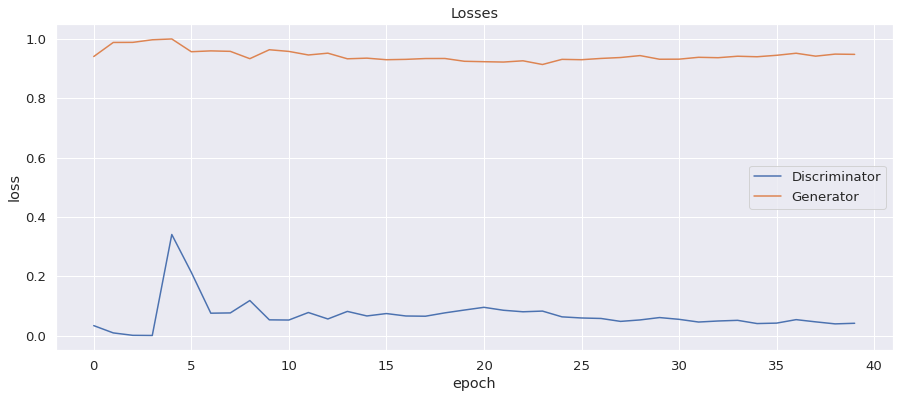

In [ ]:
plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

**Как и следовало ожидать, лосс дискриминатора в начале обучения растет (в нашем случае заметен резкий скачок), а затем падает. Лосс генератора, напротив, со временем падает (правда, несильно и не очень нестабильно: где-то после 20 эпохи заметен небольшой рост). В целом, с натяжкой можно сказать, что все идет по плану, но на самом деле судить сложно, лучше посмотреть на картинки и accuracy.**

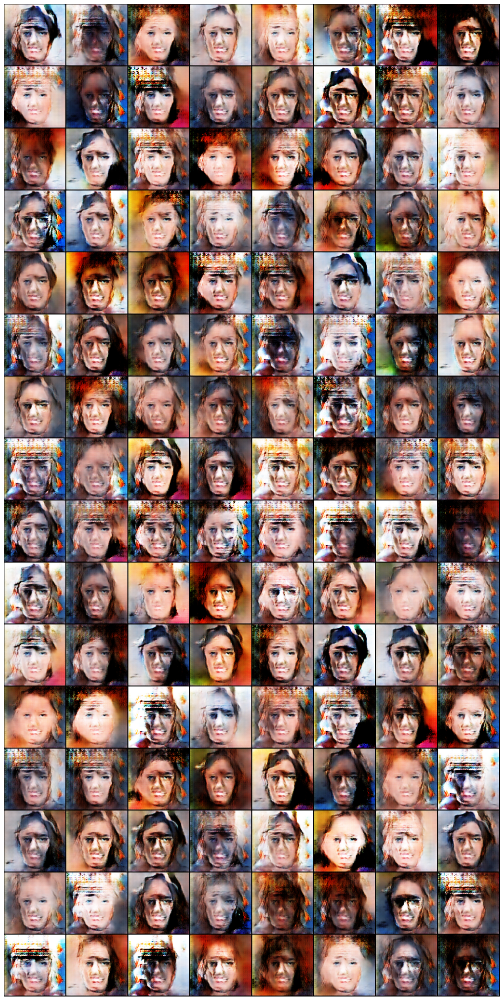

In [ ]:
generated_img = cv2.imread(f'./generated/generated-images-00{epochs}.png')
generated_img = generated_img[:, :, [2, 1, 0]]

fig, ax = plt.subplots(figsize=(18, 40))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(generated_img)

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

torch.save(model["generator"].state_dict(), Path('/content/drive/MyDrive/' + str('/generator.pt')))
torch.save(model["discriminator"].state_dict(), Path('/content/drive/MyDrive/' + str('/discriminator.pt')))

Mounted at /content/drive/


## Часть 3. Генерация изображений (1 балл)

Теперь давайте оценим качество получившихся изображений. Напишите функцию, которая выводит изображения, сгенерированные нашим генератором

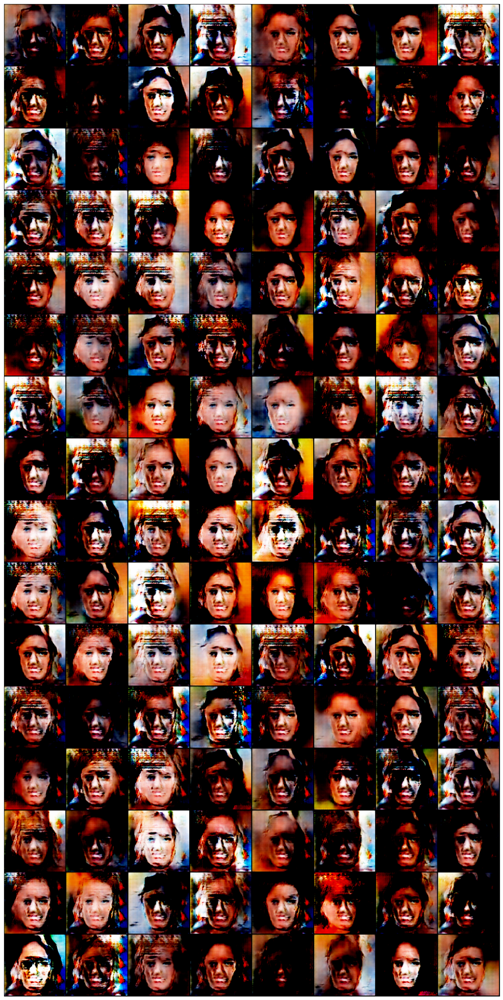

In [ ]:
def show_fake():

    latent = torch.randn(128, latent_size, 1, 1, device=device)
    generator = model['generator'].to(device)
    model["generator"].eval()
    fake_images = generator(latent)

    fig, ax = plt.subplots(figsize=(18, 40))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

show_fake()

Как вам качество получившихся изображений?

**Если сравнить результат и исходный шум, по мне, очень неплохо. (И очень страшно)**

**Видны попытки сети сгенерировать разный цвет лица, прически, фон и даже возрастные отличия. Однако общие черты одинаковы (на всех изображениях будто изображена одна маска в разных вариациях), есть множество артефактов, мелкие детали и фон не прорисованы, все "лица" улыбаются (я надеюсь). Скорее всего, используя больше эпох, мы могли бы получить более реалистичные изображения. Но, увы, дедлайн)**

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

model['generator'].load_state_dict(torch.load(Path('/content/drive/MyDrive/' + str('/generator.pt')), map_location=device))

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


<All keys matched successfully>

In [ ]:
n = len(image_files)
#real
real_images = torch.FloatTensor()
for images, _ in tqdm(data_loader):
    real_images = torch.cat((real_images, images))
real = torch.ones(n, 1, dtype=torch.int8)

#fake
model["generator"].eval()
with torch.no_grad():
    fake_images = model["generator"](torch.randn(n, 128, 1, 1))
fake = torch.zeros(n, 1, dtype=torch.int8)

  0%|          | 0/197 [00:00<?, ?it/s]

In [ ]:
print(real_images.shape, real.shape)
print(fake_images.shape, fake.shape)

torch.Size([3143, 3, 128, 128]) torch.Size([3143, 1])
torch.Size([3143, 3, 128, 128]) torch.Size([3143, 1])


In [ ]:
imgs = torch.cat((real_images, fake_images))
ni = imgs.shape[0]
imgs = imgs.reshape(ni,-1).numpy()
labels = torch.cat((real, fake)).numpy().ravel()

In [ ]:
print(imgs.shape, labels.shape)

(6286, 49152) (6286,)


In [ ]:
clf = KNeighborsClassifier(n_neighbors=1, n_jobs =-1)
cv = LeaveOneOut()
accuracy_list = []
classes_list = []

for train_index, test_index in cv.split(imgs):
    X_train, X_test = imgs[train_index], imgs[test_index]
    y_train, y_test = labels[train_index], labels[test_index]

    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    accuracy_list.append(accuracy)
    classes_list.append(y_test)

In [ ]:
sum(accuracy_list) / len(accuracy_list)

0.948456888323258

Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

**Результат не очень хороший. В идеале мы бы хотели получить accuracy = 0.5: классификатор не может разделить реальные и фейковые изображения  и определяет классы рандомно, с вероятностью 50%. Впрочем, по тому, какие изображения мы получали, этого следовало ожидать: сгенерированные изображения, хоть мы и можем опознать в них подобия лиц, очень сильно отличаются от реальных.**

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


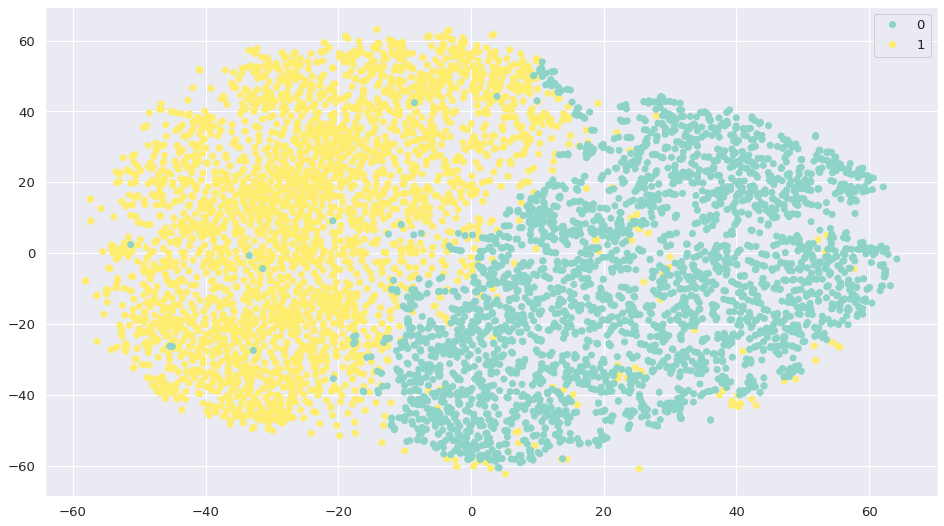

In [ ]:
imgs_tsne = TSNE(2).fit_transform(imgs)

fig, ax = plt.subplots(figsize=(16,9))
scatter = ax.scatter(x = imgs_tsne[:, 0], y = imgs_tsne[:, 1], c=labels, cmap='Set3')
legend = ax.legend(*scatter.legend_elements(), loc="upper right")
ax.add_artist(legend)
plt.show()

Прокомментируйте получившийся результат:

**Действительно, классы реальных и фейковых изображений хорошо различимы: граница четкая и почти линейная, хотя есть и выбросы. В идеале точки должны быть полностью "перемешаны".**